# Conditional Variational Auto Encoder (VAE) to project weather observation into the smaller-dimension latent space.

Data download: Met Office UK static 2km Numerical Weather Prediction (NWP) data.

In [1]:
import matplotlib.pylab as plt
import numpy as np
import pandas as pd
import os

import seaborn as sns
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from model.WeatherVAE import WeatherVAE
from common import common
from common.common import scatter_plots_side_by_side

In [4]:
common.init_notebook()

In [5]:
tf.version

<module 'tensorflow._api.v2.version' from '/Users/nrjmata/tf/lib/python3.11/site-packages/tensorflow/_api/v2/version/__init__.py'>

In [6]:
# Create the output directory
outdir = common.data_path("weather_vae_out")
os.makedirs(outdir, exist_ok=True)

In [7]:
# The dimension of the latent space.
latent_dim = 8

# The units of the VAE Dense Layers.
units = [456, 44, 284, 328]

In [8]:
# Create WeatherVAE instance

weather_vae = WeatherVAE()
df = weather_vae.load_nwp_data()
df = weather_vae.feature_engineering(df)
df_std = weather_vae.scale_data(df)
used_columns = df_std.columns

In [9]:
stat = df_std.describe()
stat

,cloud_amount_of_high_cloud,cloud_amount_of_low_cloud,cloud_amount_of_medium_cloud,cloud_amount_of_total_cloud,fog_fraction_at_screen_level,pressure_at_surface,relative_humidity_at_screen_level,temperature_at_screen_level,visibility_at_screen_level,rainfall_accumulation-PT01H,snowfall_accumulation-PT01H,wx,wy
count,8.748000e+03,8.748000e+03,8.748000e+03,8.748000e+03,8.748000e+03,8.748000e+03,8.748000e+03,8.748000e+03,8.748000e+03,8.748000e+03,8.748000e+03,8.748000e+03,8.748000e+03
mean,1.624469e-17,6.497876e-18,-6.660323e-17,-1.104639e-16,2.924044e-17,3.261934e-15,1.656958e-16,4.340581e-15,1.299575e-16,-2.599150e-17,-8.122345e-18,1.949363e-17,1.949363e-17
std,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00
min,-9.239534e-01,-1.420839e+00,-1.032364e+00,-2.239909e+00,-8.560902e-02,-3.025771e+00,-4.170688e+00,-2.863958e+00,-2.005611e+00,-2.307973e-01,-3.278195e-02,-4.371039e+00,-3.202337e+00
25%,-9.239534e-01,-1.060019e+00,-1.032364e+00,-4.676349e-01,-8.560902e-02,-6.291950e-01,-5.716143e-01,-7.173354e-01,-7.026073e-01,-2.307973e-01,-3.278195e-02,-5.378169e-01,-7.123925e-01
50%,-5.413483e-01,1.828044e-01,-2.576632e-01,5.911265e-01,-8.560902e-02,9.875065e-02,1.736383e-01,-3.017290e-02,-2.871498e-03,-2.307973e-01,-3.278195e-02,6.788241e-02,-6.053374e-02
75%,1.103854e+00,1.064808e+00,1.140576e+00,7.062093e-01,-8.560902e-02,7.164655e-01,7.420176e-01,7.527667e-01,6.825642e-01,-2.307973e-01,-3.278195e-02,6.293000e-01,8.097231e-01
max,1.524720e+00,1.144991e+00,1.386213e+00,7.062093e-01,2.441853e+01,2.491419e+00,1.846979e+00,3.001247e+00,5.065408e+00,1.782376e+01,5.265656e+01,3.127947e+00,3.262351e+00


<Axes: >

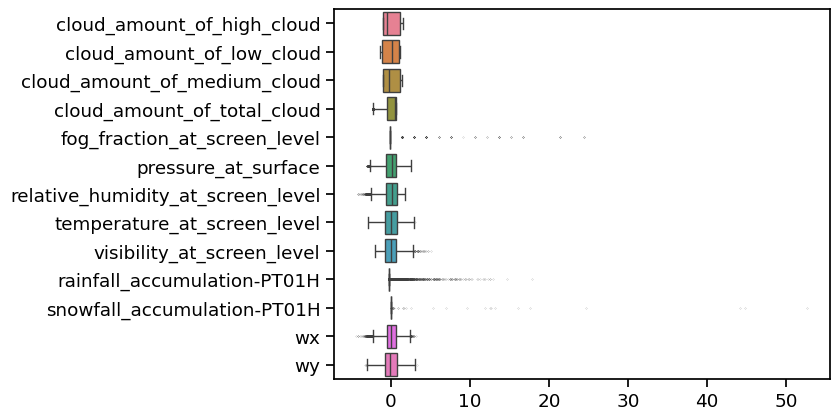

In [10]:
sns.boxplot(df_std, orient="h", fliersize=0.1)

<Axes: >

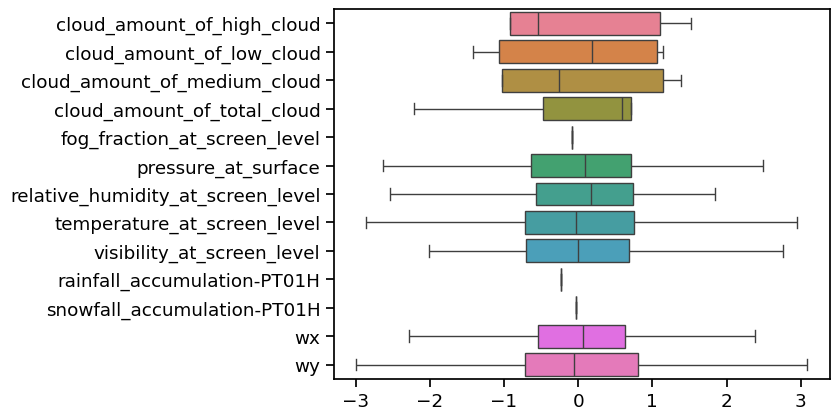

In [11]:
sns.boxplot(df_std, orient="h", showfliers = False)

## Reshape the DataFrame into the tensor

In [12]:
std_custom_set, label_set = weather_vae.prepare_dataset(df, df_std)

In [13]:
std_custom_set

array([[[[ 1.52471966,  1.14499052,  1.38621313, ..., -0.03278195,
           1.18799958,  1.60155039]]],


       [[[ 1.52471966,  1.14499052,  1.38621313, ..., -0.03278195,
           0.59176528,  1.36303811]]],


       [[[ 1.52471966,  1.14499052,  1.38621313, ..., -0.03278195,
           1.03554531,  1.42094869]]],


       ...,


       [[[-0.92395344,  0.44339651, -0.76783175, ..., -0.03278195,
           0.79181874, -0.22235784]]],


       [[[-0.92395344,  0.70398857, -0.9189928 , ..., -0.03278195,
           0.44280006, -0.29378509]]],


       [[[ 0.3960344 ,  1.02471726, -0.80562201, ..., -0.03278195,
          -0.0944541 , -0.2721738 ]]]])

## Splitting the dataset

In [14]:
label_set = np.asarray(label_set)

In [15]:
std_custom_set[0].shape

(1, 1, 13)

In [16]:
std_custom_set.shape

(8748, 1, 1, 13)

In [17]:
# Although y_train and y_test are created here, they are not used at all.

x_train,x_test,y_train,y_test = train_test_split(std_custom_set,label_set,test_size=0.2,random_state=123)

## VAE Definition

In [18]:
weather_vae.create_model(len(used_columns), latent_dim, units)
vae2 = weather_vae.vae
encoder = weather_vae.encoder
decoder = weather_vae.decoder

In [19]:
encoder.summary()

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 1, 1, 13)]           0         []                            
                                                                                                  
 flatten (Flatten)           (None, 13)                   0         ['input_1[0][0]']             
                                                                                                  
 input_2 (InputLayer)        [(None, 2)]                  0         []                            
                                                                                                  
 concatenate (Concatenate)   (None, 15)                   0         ['flatten[0][0]',             
                                                                     'input_2[0][0]']       

In [20]:
decoder.summary()

Model: "decoder"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 8)]                  0         []                            
                                                                                                  
 input_2 (InputLayer)        [(None, 2)]                  0         []                            
                                                                                                  
 concatenate_1 (Concatenate  (None, 10)                   0         ['input_3[0][0]',             
 )                                                                   'input_2[0][0]']             
                                                                                                  
 dense_4 (Dense)             (None, 328)                  3608      ['concatenate_1[0][0]'] 

# Train

In [ ]:
# Changed the optimizer due to this warning when it was run on M1 mac.
# The 2nd argument of the compile function (loss) is the reconstruction loss.
# Reconstruction loss calculates the error of decoded output from the input to the encoder.

# It is compiled in the VAE_2D module.

time_train = weather_vae.create_time_input(y_train)
time_test = weather_vae.create_time_input(y_test)
time_all = weather_vae.create_time_input(label_set)

vae2.fit([x_train, time_train], x_train, epochs=100, batch_size=32)

Epoch 1/100
219/219 [==============================] - 0s 1ms/step - loss: 0.9715
Epoch 2/100
219/219 [==============================] - 0s 906us/step - loss: 0.5985
Epoch 3/100
219/219 [==============================] - 0s 921us/step - loss: 0.4387
Epoch 4/100
219/219 [==============================] - 0s 960us/step - loss: 0.3779
Epoch 5/100
219/219 [==============================] - 0s 972us/step - loss: 0.3414
Epoch 6/100
219/219 [==============================] - 0s 1ms/step - loss: 0.3011
Epoch 7/100
219/219 [==============================] - 0s 1ms/step - loss: 0.2598
Epoch 8/100
219/219 [==============================] - 0s 1ms/step - loss: 0.2342
Epoch 9/100
219/219 [==============================] - 0s 1ms/step - loss: 0.2132
Epoch 10/100
219/219 [==============================] - 0s 1ms/step - loss: 0.1938
Epoch 11/100
219/219 [==============================] - 0s 1ms/step - loss: 0.1897
Epoch 12/100
219/219 [==============================] - 0s 1ms/step - loss: 0.1811
Epoch

In [22]:
encoded_imgs_test = encoder([x_test, time_test]).numpy()
decoded_imgs_test = vae2([x_test, time_test]).numpy()
decoded_imgs_train = vae2([x_train, time_train]).numpy()
decoded_imgs_all = vae2([std_custom_set, time_all]).numpy()

In [23]:
def xy_data_to_df(X, y):
  df = pd.DataFrame(X.reshape(-1, len(used_columns)), columns=used_columns)
  df = weather_vae.unscale_data(df, used_columns)
  df['date_time'] = np.repeat(y, 1)
  return df

In [24]:
x_test_df = xy_data_to_df(x_test, y_test)
decoded_imgs_test_df = xy_data_to_df(decoded_imgs_test, y_test)

x_train_df = xy_data_to_df(x_train, y_train)
decoded_imgs_train_df = xy_data_to_df(decoded_imgs_train, y_train)

decoded_imgs_all_df = xy_data_to_df(decoded_imgs_all, label_set)
decoded_imgs_all_df['x'] = np.array([0] * len(decoded_imgs_all_df))
decoded_imgs_all_df['y'] = np.array([0] * len(decoded_imgs_all_df))

<Figure size 640x480 with 0 Axes>

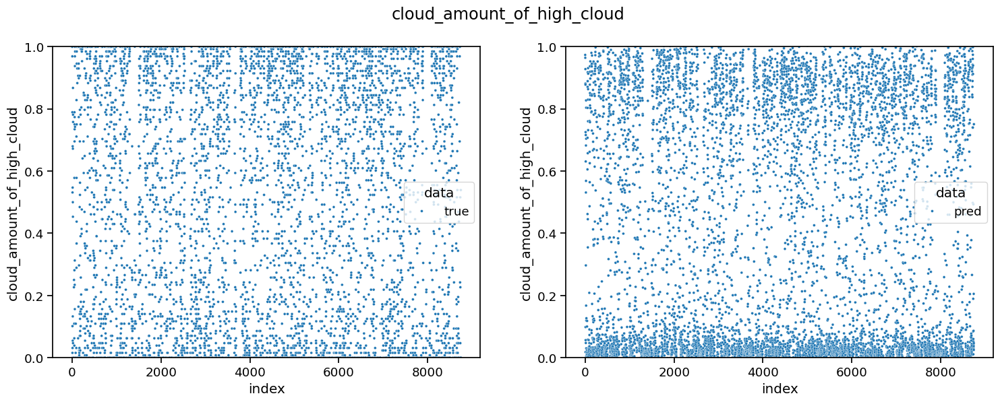

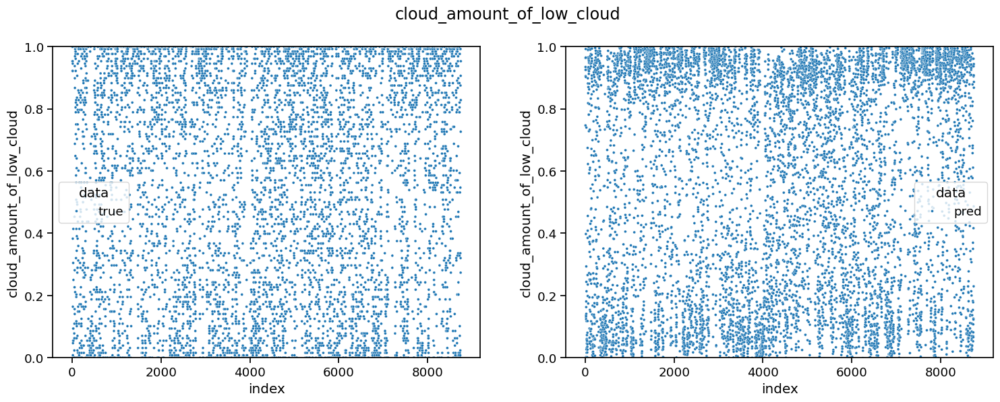

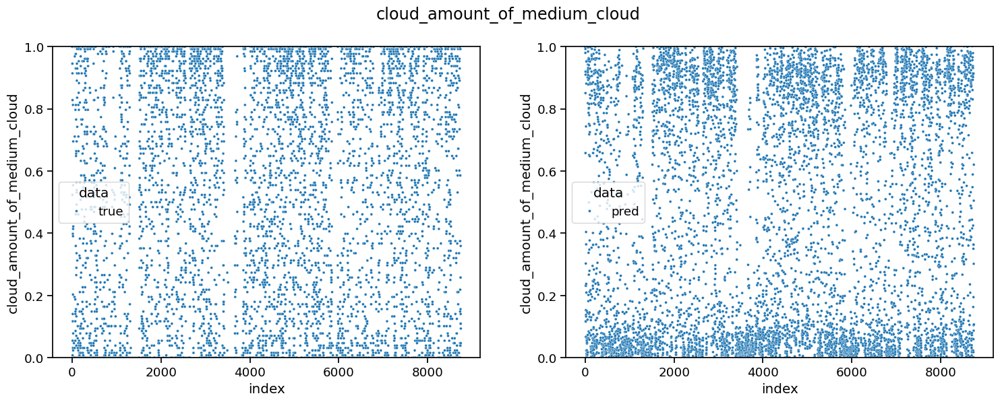

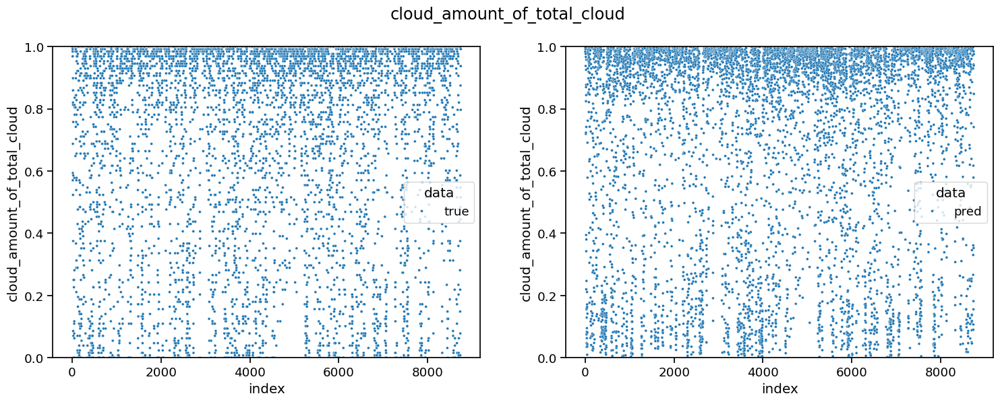

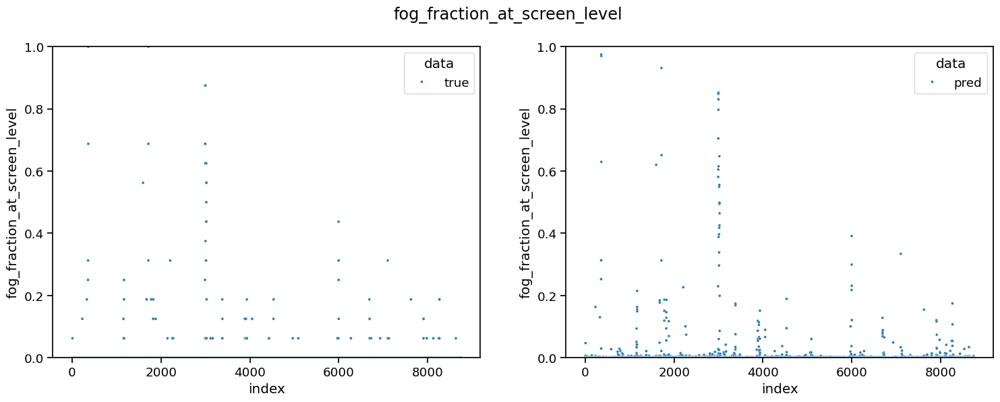

...

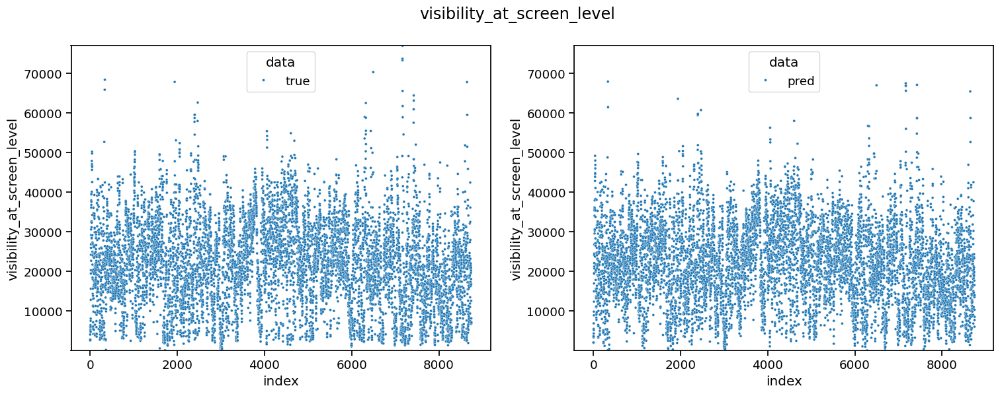

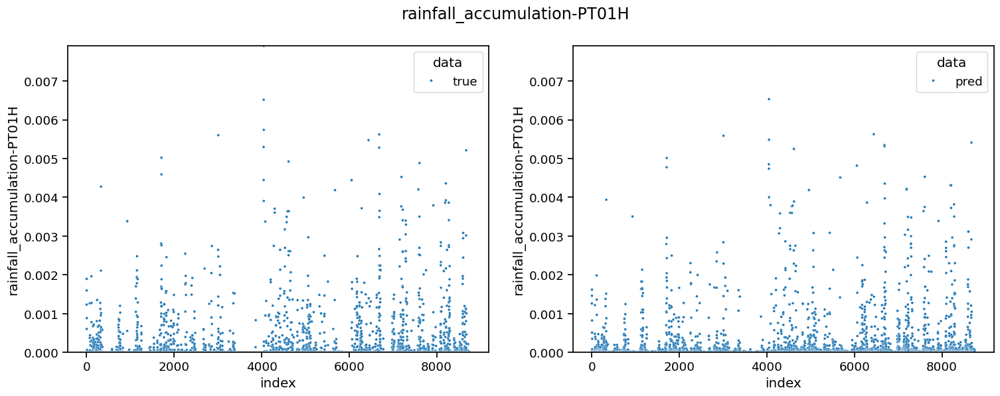

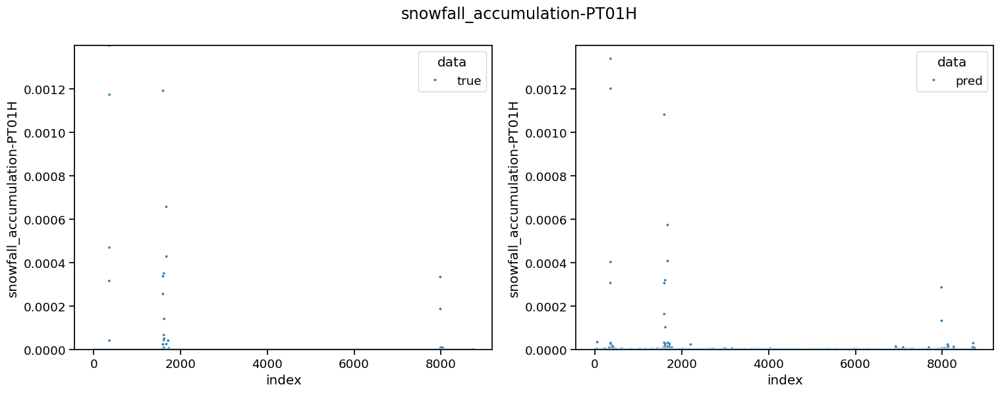

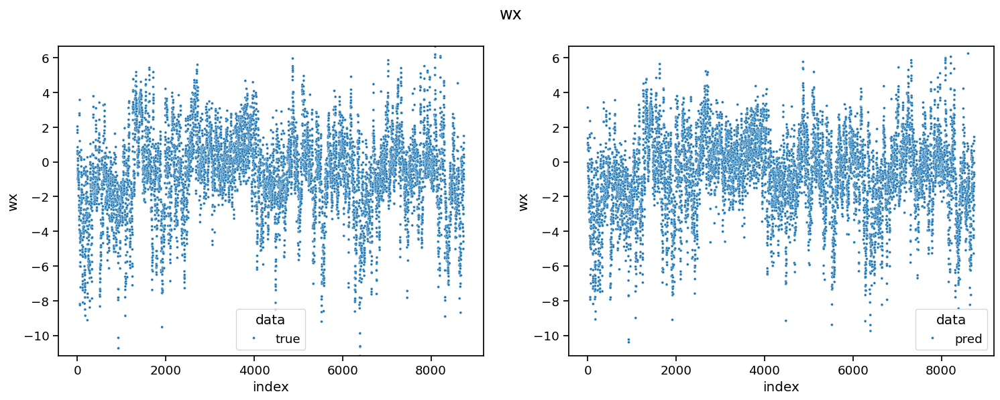

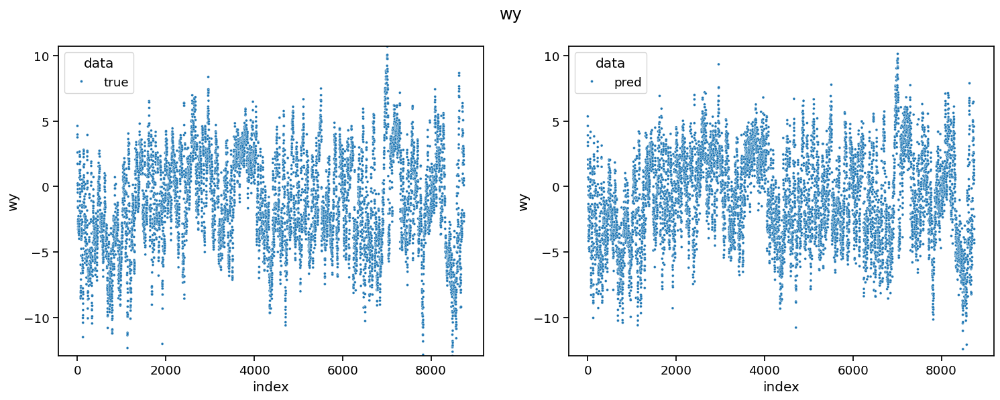

In [25]:
used_columns = [col for col in df.columns if col not in weather_vae.axis_columns]

for i, weather_param in enumerate(used_columns):
  plt.figure(i)
  scatter_plots_side_by_side(df, decoded_imgs_all_df, weather_param)

<Figure size 640x480 with 0 Axes>

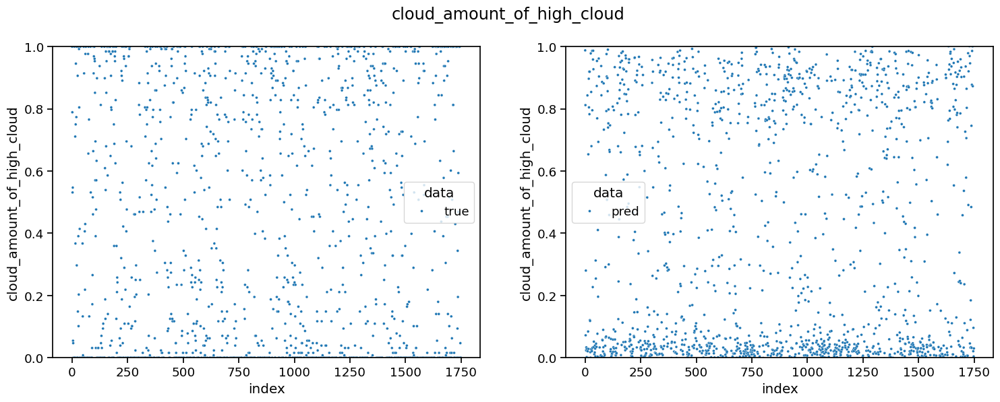

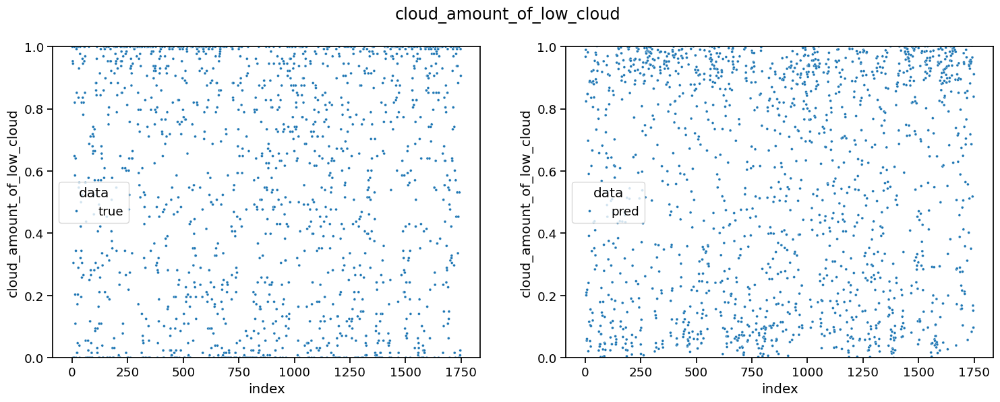

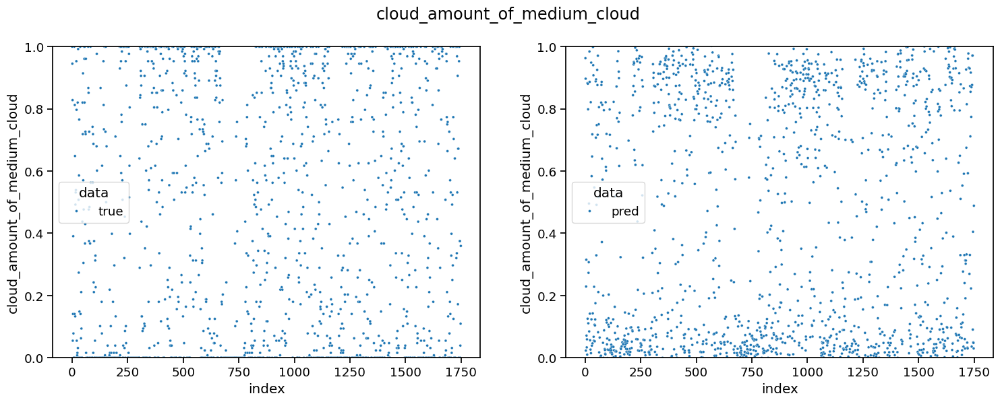

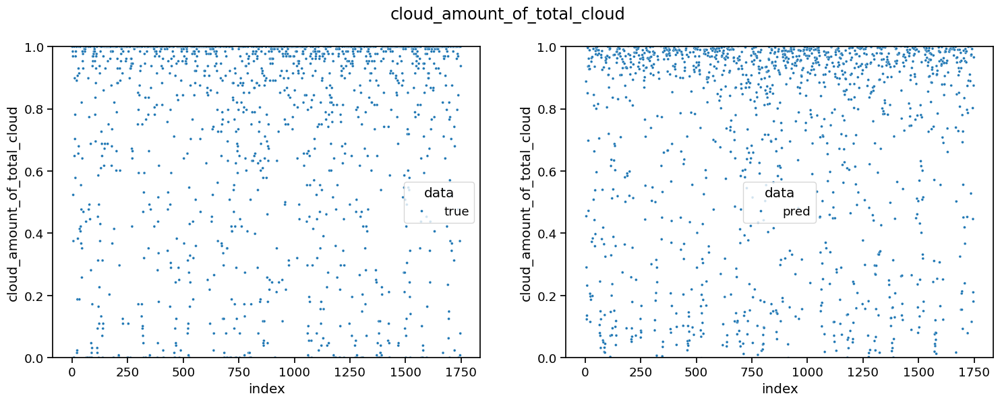

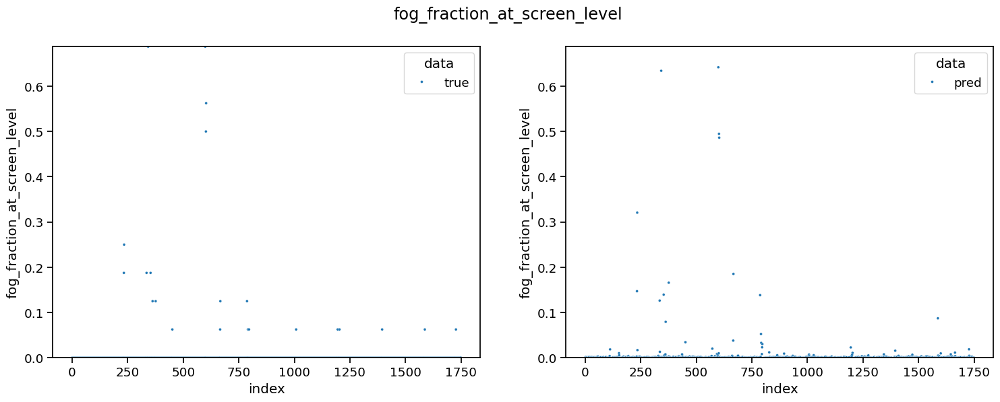

...

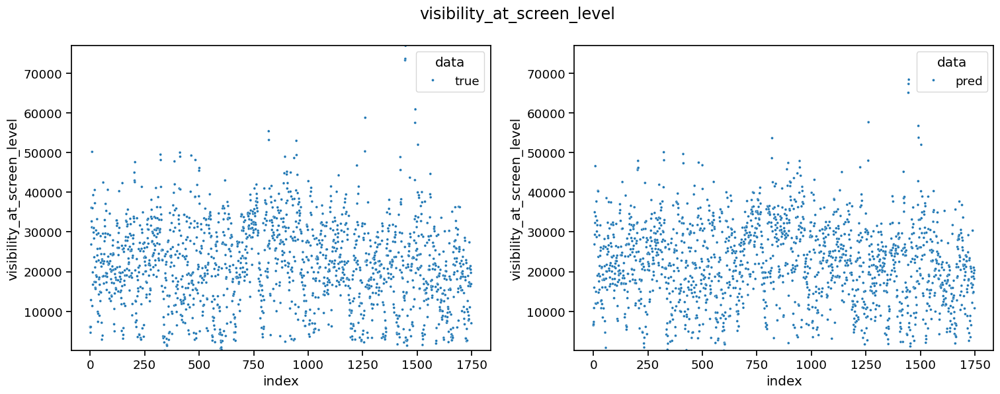

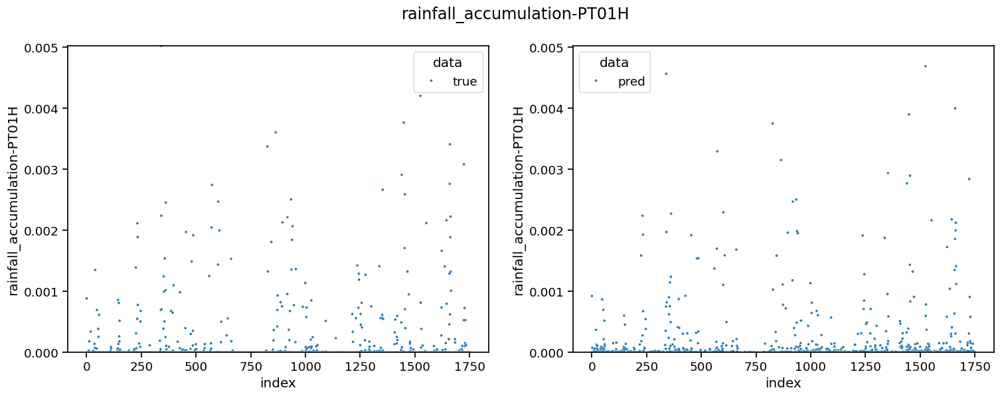

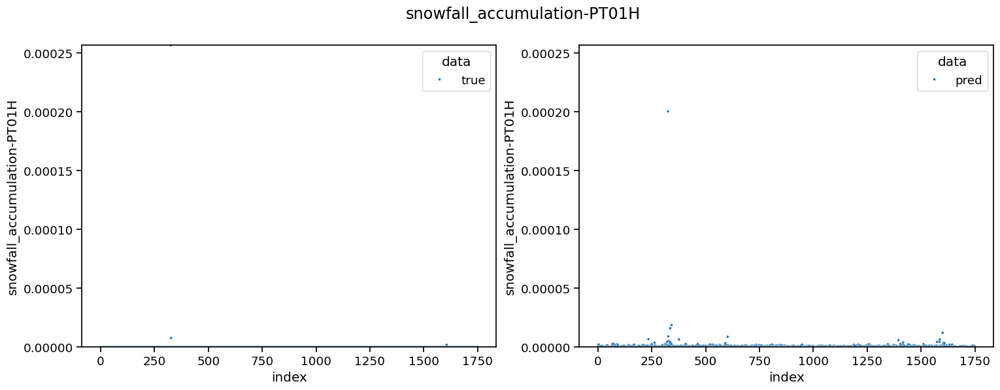

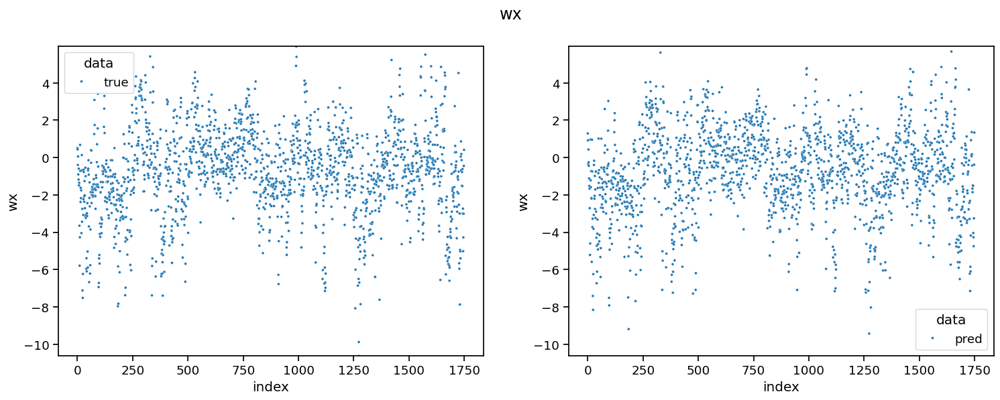

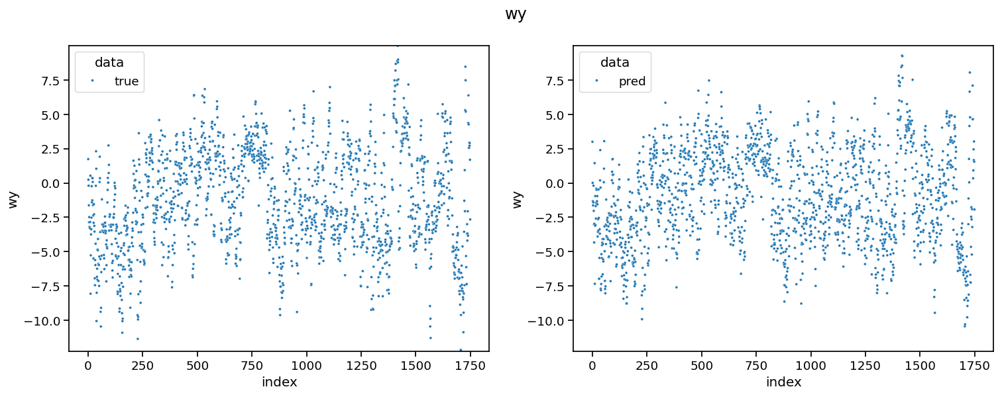

In [26]:
for i, weather_param in enumerate(used_columns):
  plt.figure(i)
  scatter_plots_side_by_side(x_test_df, decoded_imgs_test_df, weather_param)

## R2 Score

In [27]:
r2_rows = []
for weather_param in used_columns:
  num_obs = len(x_test)
  y_test_true = x_test_df[weather_param].to_numpy().reshape(num_obs, -1)
  y_test_pred = decoded_imgs_test_df[weather_param].to_numpy().reshape(num_obs, -1)
  r2_test = r2_score(y_test_true, y_test_pred, multioutput='variance_weighted')

  num_obs = len(x_train)
  y_train_true = x_train_df[weather_param].to_numpy().reshape(num_obs, -1)
  y_train_pred = decoded_imgs_train_df[weather_param].to_numpy().reshape(num_obs, -1)
  r2_train = r2_score(y_train_true, y_train_pred, multioutput='variance_weighted')  

  r2_rows.append({'weather_param': weather_param, 'r2_train': r2_train, 'r2_test': r2_test})

r2_df = pd.DataFrame(r2_rows)
r2_df

,weather_param,r2_train,r2_test
0,cloud_amount_of_high_cloud,0.937301,0.937452
1,cloud_amount_of_low_cloud,0.927291,0.918271
2,cloud_amount_of_medium_cloud,0.932297,0.932850
3,cloud_amount_of_total_cloud,0.946960,0.946782
4,fog_fraction_at_screen_level,0.983978,0.969339
5,pressure_at_surface,0.924381,0.924401
6,relative_humidity_at_screen_level,0.894856,0.887335
7,temperature_at_screen_level,0.912481,0.914473
8,visibility_at_screen_level,0.910141,0.901501
9,rainfall_accumulation-PT01H,0.957367,0.938769


## Saving all

In [28]:
# Save the models and scalers
weather_vae.save_model()

# Output all the observations projected in the latent space.
encoded_values = encoder([std_custom_set, time_all])
np.save(f"{outdir}/Latent_values_1d.npy", encoded_values)
df.to_parquet(f"{outdir}/df00.parquet")
decoded_imgs_all_df.to_parquet(f"{outdir}/df00_decoded.parquet")

INFO:tensorflow:Assets written to: /Users/nrjmata/Documents/UOE/EvoMusart 2026/weather_sonification_evomusart_2026/src/common/../../data/saved_models/WeatherVAE_Encoder.tf/assets


INFO:tensorflow:Assets written to: /Users/nrjmata/Documents/UOE/EvoMusart 2026/weather_sonification_evomusart_2026/src/common/../../data/saved_models/WeatherVAE_Encoder.tf/assets


INFO:tensorflow:Assets written to: /Users/nrjmata/Documents/UOE/EvoMusart 2026/weather_sonification_evomusart_2026/src/common/../../data/saved_models/WeatherVAE_Decoder.tf/assets


INFO:tensorflow:Assets written to: /Users/nrjmata/Documents/UOE/EvoMusart 2026/weather_sonification_evomusart_2026/src/common/../../data/saved_models/WeatherVAE_Decoder.tf/assets
